# **Importing Libraries and Data**

In [ ]:
import pandas as pd
import numpy as np
import altair as alt
import tensorflow as tf
from tensorflow import keras
from keras import layers

bikes = pd.read_csv('https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/bikes.csv')

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
bikes

,dteday,season,hr,holiday,workingday,weathersit,hum,windspeed,temp_c,feels_like_c,casual,registered
0,1/1/11,1,0,0,0,1,0.81,0,3.28,3.0014,3,13
1,1/1/11,1,1,0,0,1,0.80,0,2.34,1.9982,8,32
2,1/1/11,1,2,0,0,1,0.80,0,2.34,1.9982,5,27
3,1/1/11,1,3,0,0,1,0.75,0,3.28,3.0014,3,10
4,1/1/11,1,4,0,0,1,0.75,0,3.28,3.0014,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
16632,11/30/12,4,19,0,1,1,0.66,0,7.04,7.0010,18,359
16633,11/30/12,4,20,0,1,1,0.66,0,7.04,7.0010,12,233
16634,11/30/12,4,21,0,1,1,0.75,6,6.10,5.0012,14,169
16635,11/30/12,4,22,0,1,1,0.75,0,6.10,5.9978,18,145


# **Feature Engineering**

In [ ]:
# Create a column that combines total number of riders

bikes['total_num_riders'] = bikes['casual'] + bikes['registered']

In [ ]:
# change season to words for one hot encoding

seasons = {1:'winter',
           2: 'spring',
           3: 'summer',
           4: 'fall'}

bikes['season'] = bikes['season'].map(seasons)

In [ ]:
# create a month column

bikes['dteday'] = pd.to_datetime(bikes['dteday'])
bikes['month'] = bikes['dteday'].dt.month

In [ ]:
# map the month name to the month column

months = {
    1: 'Jan',
    2: 'Feb',
    3: 'Mar',
    4: 'Apr',
    5: 'May',
    6: 'Jun',
    7: 'Jul',
    8: 'Aug',
    9: 'Sep',
    10: 'Oct',
    11: 'Nov',
    12: 'Dec'}

bikes['month'] = bikes['month'].map(months)

In [ ]:
# create a day of the month column

bikes['day_of_month'] = bikes['dteday'].dt.day

In [ ]:
# creat a year column
bikes['year'] = bikes['dteday'].dt.year

In [ ]:
# bin windspeed according to beaufort wind scale

wind_bins = [-np.inf,1,3,7,12,18,24,31,38,46,54,63,73,np.inf]
bikes['windy_bins'] = pd.cut(bikes['windspeed'], wind_bins)

In [ ]:
wind_dict = {
    '(-inf, 1.0]': 'Calm',
    '(1.0, 3.0] ': 'Light Air',
    '(3.0, 7.0]': 'Light Breeze',
    '(7.0, 12.0]': 'Gentle Breeze',
    '(12.0, 18.0]': 'Moderate Breeze',
    '(18.0, 24.0]': 'Fresh Breeze',
    '(24.0, 31.0]': 'Strong Breeze',
    '(31.0, 38.0]': 'Moderate Gale',
    '(38.0, 46.0]': 'Fresh Gale',
    '(46.0, 54.0]': 'Strong Gale',
    '(54.0, 63.0]': 'Whole Gale',
    '(63.0, 73.0]': 'Storm',
    '(73.0, inf]': 'Hurricane'
    }
bikes['windy_bins'] = bikes['windy_bins'].astype('str')
bikes['beaufort_scale'] = bikes['windy_bins'].map(wind_dict)

In [ ]:
# try categorizing the weathersit column
weather_dict = {
    1: 'clear_clouds',
    2: 'mist_clouds',
    3: 'light_snow',
    4: 'stormy'
}

bikes['weather_cat'] = bikes['weathersit'].map(weather_dict)
bikes

,dteday,season,hr,holiday,workingday,weathersit,hum,windspeed,temp_c,feels_like_c,casual,registered,total_num_riders,month,day_of_month,year,windy_bins,beaufort_scale,weather_cat
0,2011-01-01,winter,0,0,0,1,0.81,0,3.28,3.0014,3,13,16,Jan,1,2011,"(-inf, 1.0]",Calm,clear_clouds
1,2011-01-01,winter,1,0,0,1,0.80,0,2.34,1.9982,8,32,40,Jan,1,2011,"(-inf, 1.0]",Calm,clear_clouds
2,2011-01-01,winter,2,0,0,1,0.80,0,2.34,1.9982,5,27,32,Jan,1,2011,"(-inf, 1.0]",Calm,clear_clouds
3,2011-01-01,winter,3,0,0,1,0.75,0,3.28,3.0014,3,10,13,Jan,1,2011,"(-inf, 1.0]",Calm,clear_clouds
4,2011-01-01,winter,4,0,0,1,0.75,0,3.28,3.0014,0,1,1,Jan,1,2011,"(-inf, 1.0]",Calm,clear_clouds
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16632,2012-11-30,fall,19,0,1,1,0.66,0,7.04,7.0010,18,359,377,Nov,30,2012,"(-inf, 1.0]",Calm,clear_clouds
16633,2012-11-30,fall,20,0,1,1,0.66,0,7.04,7.0010,12,233,245,Nov,30,2012,"(-inf, 1.0]",Calm,clear_clouds
16634,2012-11-30,fall,21,0,1,1,0.75,6,6.10,5.0012,14,169,183,Nov,30,2012,"(3.0, 7.0]",Light Breeze,clear_clouds
16635,2012-11-30,fall,22,0,1,1,0.75,0,6.10,5.9978,18,145,163,Nov,30,2012,"(-inf, 1.0]",Calm,clear_clouds


# **Data Exploration**

In [ ]:
bikes.query('month != "Dec"').groupby('year')['total_num_riders'].agg('sum').reset_index()

,year,total_num_riders
0,2011,1155780
1,2012,1925863


In [ ]:
bikes.query('month == "Nov"').groupby('year')['total_num_riders'].agg('sum').reset_index()

,year,total_num_riders
0,2011,102167
1,2012,152664


In [ ]:
(alt.Chart(bikes).encode(
    x = 'dteday',
    y = 'total_num_riders'
).mark_line())

In [ ]:
import altair as alt

alt.data_transformers.disable_max_rows()

(alt.Chart(bikes).encode(
    x = 'feels_like_c',
    y = 'total_num_riders',
    color = 'total_num_riders'
).mark_point())

alt.Chart(...)

In [ ]:
import altair as alt

alt.data_transformers.disable_max_rows()

(alt.Chart(bikes).encode(
    x = 'temp_c',
    y = 'total_num_riders',
    color = 'total_num_riders'
).mark_point())

alt.Chart(...)

In [ ]:
sum_by_season = bikes.groupby('season')['total_num_riders'].agg('sum').reset_index()

(alt.Chart(sum_by_season).encode(
    y = 'total_num_riders',
    x = 'season'
).mark_bar())

alt.Chart(...)

In [ ]:
sum_by_month = bikes.groupby('month')['total_num_riders'].agg('sum').reset_index()

(alt.Chart(sum_by_month).encode(
    y = 'total_num_riders',
    x = 'month'
).mark_bar())

alt.Chart(...)

In [ ]:
sum_by_beaufort = bikes.groupby('beaufort_scale')['total_num_riders'].agg('sum').reset_index()

(alt.Chart(sum_by_beaufort).encode(
    y = 'total_num_riders',
    x = 'beaufort_scale'
).mark_bar())

alt.Chart(...)

In [ ]:
sum_by_weather = bikes.groupby('weather_cat')['total_num_riders'].agg('sum').reset_index()

(alt.Chart(sum_by_weather).encode(
    y = 'total_num_riders',
    x = 'weather_cat'
).mark_bar())

alt.Chart(...)

In [ ]:
sum_by_day = bikes.groupby('day_of_month')['total_num_riders'].agg('sum').reset_index()

(alt.Chart(sum_by_day).encode(
    y = 'total_num_riders',
    x = 'day_of_month'
).mark_bar())

alt.Chart(...)

In [ ]:
bikes.query(month=="Dec")

# **Modeling Baby**

In [ ]:
features = ['season', 'holiday', 'workingday', 'month', 'year', 'beaufort_scale', 'weather_cat', 'hr', 'hum', 'windspeed',
       'temp_c', 'feels_like_c', 'total_num_riders']

bikes_model_df = pd.get_dummies(bikes[features])

bikes_model_df

,holiday,workingday,year,hr,hum,windspeed,temp_c,feels_like_c,total_num_riders,season_fall,season_spring,season_summer,season_winter,month_Apr,month_Aug,month_Dec,month_Feb,month_Jan,month_Jul,month_Jun,month_Mar,month_May,month_Nov,month_Oct,month_Sep,beaufort_scale_Calm,beaufort_scale_Fresh Breeze,beaufort_scale_Fresh Gale,beaufort_scale_Gentle Breeze,beaufort_scale_Light Breeze,beaufort_scale_Moderate Breeze,beaufort_scale_Moderate Gale,beaufort_scale_Strong Breeze,beaufort_scale_Strong Gale,beaufort_scale_Whole Gale,weather_cat_clear_clouds,weather_cat_light_snow,weather_cat_mist_clouds,weather_cat_stormy
0,0,0,2011,0,0.81,0,3.28,3.0014,16,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
1,0,0,2011,1,0.80,0,2.34,1.9982,40,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
2,0,0,2011,2,0.80,0,2.34,1.9982,32,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
3,0,0,2011,3,0.75,0,3.28,3.0014,13,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
4,0,0,2011,4,0.75,0,3.28,3.0014,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16632,0,1,2012,19,0.66,0,7.04,7.0010,377,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
16633,0,1,2012,20,0.66,0,7.04,7.0010,245,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
16634,0,1,2012,21,0.75,6,6.10,5.0012,183,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
16635,0,1,2012,22,0.75,0,6.10,5.9978,163,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0


In [ ]:
# splitting the training and the testing data sets

# train_dataset = bikes_model_df.sample(frac=0.8, random_state=0)
# test_dataset = bikes_model_df.drop(train_dataset.index)



In [ ]:
# make a x and y

bikes_model_x = bikes_model_df.drop(['total_num_riders'], axis = 1)

bikes_model_y = bikes_model_df['total_num_riders']

In [ ]:
#Split the data
from sklearn.model_selection import train_test_split

#from tensorflow.keras.layers.experimental import preprocessing
#from sklearn.preprocessing import LabelEncoder
#from sklearn.preprocessing import MaxAbsScaler
from sklearn import preprocessing
#from sklearn.preprocessing import MinMaxScaler

X_train, X_test, y_train, y_test = train_test_split(bikes_model_x, bikes_model_y, test_size = .3) # Get rid of random state

#Scale the data
minmax_scaler = preprocessing.MinMaxScaler()

X_train = minmax_scaler.fit_transform(X_train)
X_test = minmax_scaler.transform(X_test)

In [ ]:
X_train.shape

(11645, 38)

In [ ]:
from keras.backend import dropout
from keras.models import Sequential
from keras.layers import Dense
from keras.layers.core import Dense,Dropout,Activation


model = Sequential()
model.add(Dense(16, input_dim=38, activation='relu'))
model.add(Dense(200, activation = 'relu'))
model.add(Dense(150, activation = 'relu'))
model.add(Dense(50, activation = 'relu'))
model.add(Dense(10, activation = 'relu'))
model.add(Dense(5, activation = 'relu'))
model.add(Dense(1, activation='linear'))

# Compile model
model.compile(loss='mean_absolute_error', optimizer= 'Adam', metrics=['mean_absolute_error'])

In [ ]:
history = model.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 130, verbose = 0, batch_size = 9)

In [ ]:
# evaluate the model
_, train_mse = model.evaluate(X_train, y_train, verbose = 1)

_, test_mse = model.evaluate(X_test, y_test, verbose = 1)
#test_mse
train_mse

156/156 [==============================] - 0s 2ms/step - loss: 28.2365 - mean_absolute_error: 28.2365


23.621339797973633

In [ ]:
predictions = model.predict(X_test)

from sklearn.metrics import r2_score
r2 = r2_score(y_test, predictions)
print(r2)

#R2_score()

0.9350695204735923


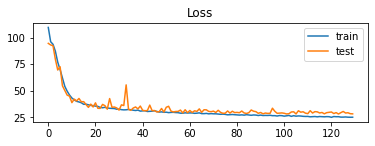

In [ ]:
# plot loss during training
from matplotlib import pyplot
pyplot.subplot(211)
pyplot.title('Loss')
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()

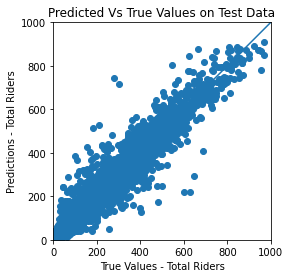

In [ ]:
#test_predictions = predictions.flatten()

a = plt.axes(aspect='equal')
plt.scatter(y_test, predictions)
plt.xlabel('True Values - Total Riders')
plt.ylabel('Predictions - Total Riders')
plt.title('Predicted Vs True Values on Test Data')
lims = [0,1000]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

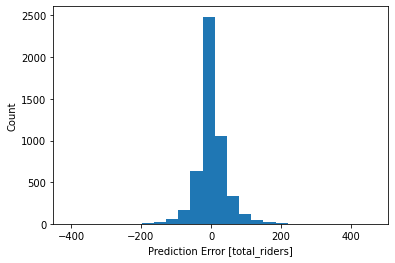

In [ ]:
error = test_predictions - y_test
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [total_riders]')
_ = plt.ylabel('Count')

In [ ]:
# Saving (Pickleing) the Model

model.save('dnn_model')

INFO:tensorflow:Assets written to: dnn_model/assets


# **Holdout Data Predictions**

In [ ]:
holdout_data = pd.read_csv('https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/bikes_december.csv')
holdout_data

,dteday,season,hr,holiday,workingday,weathersit,hum,windspeed,temp_c,feels_like_c
0,12/1/12,4,0,0,0,1,0.81,0,4.22,3.9980
1,12/1/12,4,1,0,0,1,0.81,0,4.22,3.9980
2,12/1/12,4,2,0,0,2,0.81,0,4.22,3.9980
3,12/1/12,4,3,0,0,2,0.81,9,4.22,1.9982
4,12/1/12,4,4,0,0,1,0.81,6,4.22,3.0014
...,...,...,...,...,...,...,...,...,...,...
737,12/31/12,1,19,0,1,2,0.60,11,4.22,1.0016
738,12/31/12,1,20,0,1,2,0.60,11,4.22,1.0016
739,12/31/12,1,21,0,1,1,0.60,11,4.22,1.0016
740,12/31/12,1,22,0,1,1,0.56,9,4.22,1.9982


# **Feature Engineering for holdout data** 

In [ ]:
# change season to words for one hot encoding

seasons = {1:'winter',
           2: 'spring',
           3: 'summer',
           4: 'fall'}

holdout_data['season'] = holdout_data['season'].map(seasons)

In [ ]:
# create a month column

holdout_data['dteday'] = pd.to_datetime(holdout_data['dteday'])
holdout_data['month'] = holdout_data['dteday'].dt.month

holdout_data

,dteday,season,hr,holiday,workingday,weathersit,hum,windspeed,temp_c,feels_like_c,month
0,2012-12-01,fall,0,0,0,1,0.81,0,4.22,3.9980,12
1,2012-12-01,fall,1,0,0,1,0.81,0,4.22,3.9980,12
2,2012-12-01,fall,2,0,0,2,0.81,0,4.22,3.9980,12
3,2012-12-01,fall,3,0,0,2,0.81,9,4.22,1.9982,12
4,2012-12-01,fall,4,0,0,1,0.81,6,4.22,3.0014,12
...,...,...,...,...,...,...,...,...,...,...,...
737,2012-12-31,winter,19,0,1,2,0.60,11,4.22,1.0016,12
738,2012-12-31,winter,20,0,1,2,0.60,11,4.22,1.0016,12
739,2012-12-31,winter,21,0,1,1,0.60,11,4.22,1.0016,12
740,2012-12-31,winter,22,0,1,1,0.56,9,4.22,1.9982,12


In [ ]:
# map the month name to the month column

months = {
    1: 'Jan',
    2: 'Feb',
    3: 'Mar',
    4: 'Apr',
    5: 'May',
    6: 'Jun',
    7: 'Jul',
    8: 'Aug',
    9: 'Sep',
    10: 'Oct',
    11: 'Nov',
    12: 'Dec'}

holdout_data['month'] = holdout_data['month'].map(months)
holdout_data

,dteday,season,hr,holiday,workingday,weathersit,hum,windspeed,temp_c,feels_like_c,month
0,2012-12-01,fall,0,0,0,1,0.81,0,4.22,3.9980,Dec
1,2012-12-01,fall,1,0,0,1,0.81,0,4.22,3.9980,Dec
2,2012-12-01,fall,2,0,0,2,0.81,0,4.22,3.9980,Dec
3,2012-12-01,fall,3,0,0,2,0.81,9,4.22,1.9982,Dec
4,2012-12-01,fall,4,0,0,1,0.81,6,4.22,3.0014,Dec
...,...,...,...,...,...,...,...,...,...,...,...
737,2012-12-31,winter,19,0,1,2,0.60,11,4.22,1.0016,Dec
738,2012-12-31,winter,20,0,1,2,0.60,11,4.22,1.0016,Dec
739,2012-12-31,winter,21,0,1,1,0.60,11,4.22,1.0016,Dec
740,2012-12-31,winter,22,0,1,1,0.56,9,4.22,1.9982,Dec


In [ ]:
# creat a year column
holdout_data['year'] = holdout_data['dteday'].dt.year
holdout_data

,dteday,season,hr,holiday,workingday,weathersit,hum,windspeed,temp_c,feels_like_c,month,year
0,2012-12-01,fall,0,0,0,1,0.81,0,4.22,3.9980,Dec,2012
1,2012-12-01,fall,1,0,0,1,0.81,0,4.22,3.9980,Dec,2012
2,2012-12-01,fall,2,0,0,2,0.81,0,4.22,3.9980,Dec,2012
3,2012-12-01,fall,3,0,0,2,0.81,9,4.22,1.9982,Dec,2012
4,2012-12-01,fall,4,0,0,1,0.81,6,4.22,3.0014,Dec,2012
...,...,...,...,...,...,...,...,...,...,...,...,...
737,2012-12-31,winter,19,0,1,2,0.60,11,4.22,1.0016,Dec,2012
738,2012-12-31,winter,20,0,1,2,0.60,11,4.22,1.0016,Dec,2012
739,2012-12-31,winter,21,0,1,1,0.60,11,4.22,1.0016,Dec,2012
740,2012-12-31,winter,22,0,1,1,0.56,9,4.22,1.9982,Dec,2012


In [ ]:
# bin windspeed according to beaufort wind scale

wind_bins = [-np.inf,1,3,7,12,18,24,31,38,46,54,63,73,np.inf]
holdout_data['windy_bins'] = pd.cut(holdout_data['windspeed'], wind_bins)

In [ ]:
wind_dict = {
    '(-inf, 1.0]': 'Calm',
    '(1.0, 3.0] ': 'Light Air',
    '(3.0, 7.0]': 'Light Breeze',
    '(7.0, 12.0]': 'Gentle Breeze',
    '(12.0, 18.0]': 'Moderate Breeze',
    '(18.0, 24.0]': 'Fresh Breeze',
    '(24.0, 31.0]': 'Strong Breeze',
    '(31.0, 38.0]': 'Moderate Gale',
    '(38.0, 46.0]': 'Fresh Gale',
    '(46.0, 54.0]': 'Strong Gale',
    '(54.0, 63.0]': 'Whole Gale',
    '(63.0, 73.0]': 'Storm',
    '(73.0, inf]': 'Hurricane'
    }
holdout_data['windy_bins'] = holdout_data['windy_bins'].astype('str')
holdout_data['beaufort_scale'] = holdout_data['windy_bins'].map(wind_dict)

In [ ]:
# try categorizing the weathersit column
weather_dict = {
    1: 'clear_clouds',
    2: 'mist_clouds',
    3: 'light_snow',
    4: 'stormy'
}

holdout_data['weather_cat'] = holdout_data['weathersit'].map(weather_dict)
holdout_data

,dteday,season,hr,holiday,workingday,weathersit,hum,windspeed,temp_c,feels_like_c,month,year,windy_bins,beaufort_scale,weather_cat
0,2012-12-01,fall,0,0,0,1,0.81,0,4.22,3.9980,Dec,2012,"(-inf, 1.0]",Calm,clear_clouds
1,2012-12-01,fall,1,0,0,1,0.81,0,4.22,3.9980,Dec,2012,"(-inf, 1.0]",Calm,clear_clouds
2,2012-12-01,fall,2,0,0,2,0.81,0,4.22,3.9980,Dec,2012,"(-inf, 1.0]",Calm,mist_clouds
3,2012-12-01,fall,3,0,0,2,0.81,9,4.22,1.9982,Dec,2012,"(7.0, 12.0]",Gentle Breeze,mist_clouds
4,2012-12-01,fall,4,0,0,1,0.81,6,4.22,3.0014,Dec,2012,"(3.0, 7.0]",Light Breeze,clear_clouds
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
737,2012-12-31,winter,19,0,1,2,0.60,11,4.22,1.0016,Dec,2012,"(7.0, 12.0]",Gentle Breeze,mist_clouds
738,2012-12-31,winter,20,0,1,2,0.60,11,4.22,1.0016,Dec,2012,"(7.0, 12.0]",Gentle Breeze,mist_clouds
739,2012-12-31,winter,21,0,1,1,0.60,11,4.22,1.0016,Dec,2012,"(7.0, 12.0]",Gentle Breeze,clear_clouds
740,2012-12-31,winter,22,0,1,1,0.56,9,4.22,1.9982,Dec,2012,"(7.0, 12.0]",Gentle Breeze,clear_clouds


In [ ]:
features = ['season', 'holiday', 'workingday', 'month', 'year', 'beaufort_scale', 'weather_cat', 'hr', 'hum', 'windspeed',
       'temp_c', 'feels_like_c']

holdout_data_norm = pd.get_dummies(holdout_data[features])

holdout_data_norm

,holiday,workingday,year,hr,hum,windspeed,temp_c,feels_like_c,season_fall,season_winter,month_Dec,beaufort_scale_Calm,beaufort_scale_Fresh Breeze,beaufort_scale_Fresh Gale,beaufort_scale_Gentle Breeze,beaufort_scale_Light Breeze,beaufort_scale_Moderate Breeze,beaufort_scale_Moderate Gale,beaufort_scale_Strong Breeze,weather_cat_clear_clouds,weather_cat_light_snow,weather_cat_mist_clouds
0,0,0,2012,0,0.81,0,4.22,3.9980,1,0,1,1,0,0,0,0,0,0,0,1,0,0
1,0,0,2012,1,0.81,0,4.22,3.9980,1,0,1,1,0,0,0,0,0,0,0,1,0,0
2,0,0,2012,2,0.81,0,4.22,3.9980,1,0,1,1,0,0,0,0,0,0,0,0,0,1
3,0,0,2012,3,0.81,9,4.22,1.9982,1,0,1,0,0,0,1,0,0,0,0,0,0,1
4,0,0,2012,4,0.81,6,4.22,3.0014,1,0,1,0,0,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
737,0,1,2012,19,0.60,11,4.22,1.0016,0,1,1,0,0,0,1,0,0,0,0,0,0,1
738,0,1,2012,20,0.60,11,4.22,1.0016,0,1,1,0,0,0,1,0,0,0,0,0,0,1
739,0,1,2012,21,0.60,11,4.22,1.0016,0,1,1,0,0,0,1,0,0,0,0,1,0,0
740,0,1,2012,22,0.56,9,4.22,1.9982,0,1,1,0,0,0,1,0,0,0,0,1,0,0


In [ ]:
holdout_data_norm['beaufort_scale_Strong Gale'] = 0
holdout_data_norm['beaufort_scale_Whole Gale'] = 0
holdout_data_norm['month_Jan'] = 0
holdout_data_norm['month_Feb'] = 0
holdout_data_norm['month_Mar'] = 0
holdout_data_norm['month_Apr'] = 0
holdout_data_norm['month_May'] = 0
holdout_data_norm['month_Jun'] = 0
holdout_data_norm['month_Jul'] = 0
holdout_data_norm['month_Aug'] = 0
holdout_data_norm['month_Sep'] = 0
holdout_data_norm['month_Oct'] = 0
holdout_data_norm['month_Nov'] = 0
holdout_data_norm['season_spring'] = 0
holdout_data_norm['season_summer'] = 0
holdout_data_norm['weather_cat_stormy'] = 0
holdout_data_norm

,holiday,workingday,year,hr,hum,windspeed,temp_c,feels_like_c,season_fall,season_winter,month_Dec,beaufort_scale_Calm,beaufort_scale_Fresh Breeze,beaufort_scale_Fresh Gale,beaufort_scale_Gentle Breeze,beaufort_scale_Light Breeze,beaufort_scale_Moderate Breeze,beaufort_scale_Moderate Gale,beaufort_scale_Strong Breeze,weather_cat_clear_clouds,weather_cat_light_snow,weather_cat_mist_clouds,beaufort_scale_Strong Gale,beaufort_scale_Whole Gale,month_Jan,month_Feb,month_Mar,month_Apr,month_May,month_Jun,month_Jul,month_Aug,month_Sep,month_Oct,month_Nov,season_spring,season_summer,weather_cat_stormy
0,0,0,2012,0,0.81,0,4.22,3.9980,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,2012,1,0.81,0,4.22,3.9980,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,2012,2,0.81,0,4.22,3.9980,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,2012,3,0.81,9,4.22,1.9982,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,2012,4,0.81,6,4.22,3.0014,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
737,0,1,2012,19,0.60,11,4.22,1.0016,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
738,0,1,2012,20,0.60,11,4.22,1.0016,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
739,0,1,2012,21,0.60,11,4.22,1.0016,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
740,0,1,2012,22,0.56,9,4.22,1.9982,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
column_names = ['holiday', 'workingday', 'year', 'hr', 'hum', 'windspeed', 'temp_c',
       'feels_like_c', 'season_fall', 'season_spring',
       'season_summer', 'season_winter', 'month_Apr', 'month_Aug', 'month_Dec',
       'month_Feb', 'month_Jan', 'month_Jul', 'month_Jun', 'month_Mar',
       'month_May', 'month_Nov', 'month_Oct', 'month_Sep',
       'beaufort_scale_Calm', 'beaufort_scale_Fresh Breeze',
       'beaufort_scale_Fresh Gale', 'beaufort_scale_Gentle Breeze',
       'beaufort_scale_Light Breeze', 'beaufort_scale_Moderate Breeze',
       'beaufort_scale_Moderate Gale', 'beaufort_scale_Strong Breeze',
       'beaufort_scale_Strong Gale', 'beaufort_scale_Whole Gale',
       'weather_cat_clear_clouds', 'weather_cat_light_snow',
       'weather_cat_mist_clouds', 'weather_cat_stormy']

holdout_data_norm = holdout_data_norm.reindex(columns=column_names)


In [ ]:
holdout_data_norm = minmax_scaler.transform(holdout_data_norm)
holdout_data_norm

array([[0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 1., 0.],
       ...,
       [0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.]])

In [ ]:
holdout_predictions = predictions = model.predict(holdout_data_norm)
holdout_predictions

array([[106.57005  ],
       [ 85.30233  ],
       [ 47.918686 ],
       [ 32.129543 ],
       [ 17.33202  ],
       [  9.618062 ],
       [ 13.288867 ],
       [ 26.602453 ],
       [ 78.90546  ],
       [137.45529  ],
       [298.46085  ],
       [455.48868  ],
       [517.21344  ],
       [515.4057   ],
       [477.7446   ],
       [443.774    ],
       [382.50308  ],
       [387.41443  ],
       [249.16522  ],
       [184.79579  ],
       [175.1093   ],
       [ 75.53781  ],
       [ 54.60929  ],
       [ 56.116295 ],
       [ 97.56504  ],
       [ 73.78561  ],
       [ 47.591858 ],
       [ 25.260181 ],
       [ 11.927047 ],
       [  8.0704975],
       [  8.463165 ],
       [ 26.318346 ],
       [ 89.96845  ],
       [181.32565  ],
       [321.90143  ],
       [439.42523  ],
       [515.3098   ],
       [593.7204   ],
       [613.3321   ],
       [575.87494  ],
       [495.7154   ],
       [362.27408  ],
       [397.34717  ],
       [329.2351   ],
       [270.8204   ],
       [22

In [ ]:
pd.DataFrame(holdout_predictions).to_csv('module4_predictions.csv')

In [ ]:
from google.colab import files
files.download('module4_predictions.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Grid Search Stuff**

In [ ]:
# import numpy
# from sklearn.model_selection import GridSearchCV
# from keras.wrappers.scikit_learn import KerasRegressor

In [ ]:
#Function to create model, required for KerasClassifier
# def create_model(optimizer='adam'):
# 	model = Sequential()
# 	model.add(Dense(64, input_dim=38, activation='relu'))
# 	model.add(Dense(1, activation='relu'))
# 	# Compile model
# 	model.compile(loss='MSE', optimizer=optimizer, metrics=['mse'])
# 	return model


# # Use this in to our model and try it out Travis

# model = KerasRegressor(build_fn=create_model, verbose=0)
# # define the grid search parameters
# batch_size = [9,10,11]
# epochs = [100, 120, 130]
# param_grid = dict(batch_size=batch_size, epochs=epochs)
# grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)
# grid_result = grid.fit(X_train, y_train)

In [ ]:
# summarize results
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))